In [1]:
import numpy as np
import pandas as pd
pd.options.display.max_columns = 100
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import *
from sklearn.ensemble import *
from sklearn.svm import SVC
import skbio
import scipy
import lightgbm as lgb
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
%matplotlib inline

/opt/anaconda3/lib/python3.7/site-packages/lightgbm/__init__.py:48: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [2]:
meta = pd.read_csv('hmp/mapping-orig.txt', sep='\t')
meta = meta[meta['MISLABELED']!=True]
meta = meta[meta['CONTAMINATED']!=True]
meta.head()

,SampleID,BarcodeSequence,LinkerPrimerSequence,TARGET_SUBFRAGMENT,SAMP_COLLECT_DEVICE,RUN_CENTER,ASSIGNED_FROM_GEO,EXPERIMENT_CENTER,TITLE,RUN_PREFIX,AGE,INVESTIGATION_TYPE,HOST_COMMON_NAME,DEPTH,SAMPLE_CENTER,HOST_TAXID,SUBMIT_TO_INSDC,COMMON_NAME,INCLUDES_TIMESERIES,PFPH,LONGITUDE,STUDY_ABSTRACT,BODY_SITE,SEQUENCING_METH,PROJECT_NAME,ELEVATION,RUN_DATE,HIV,COLLECTION_DATE,GENDER,ALTITUDE,ENV_BIOME,SRS,SEX,PLATFORM,COUNTRY,STUDY_TITLE,HMPBODYSUPERSITE,HOST_SUBJECT_ID,ANONYMIZED_NAME,TAXON_ID,REGION,SAMP_SIZE,ENV_FEATURE,STUDY_DESCRIPTION,SPECIFIC_BODY_SITE,MISLABELED,AGE_UNIT,MIENS_COMPLIANT,BODY_MASS_INDEX,EXPERIMENT_DESIGN_DESCRIPTION,Description_duplicate,BODY_HABITAT,ABX_PAST_6_MOS,OBESITY,ENV_MATTER,TARGET_GENE,CONTAMINATED,CHRONIC_CONDITION,KEY_SEQ,BODY_PRODUCT,PSN,MYOCARDINFARCT,STUDY_ID,COLLECTDAY,ATHEROSCLEROSIS,SMOKER,STUDY_ALIAS,PCR_PRIMERS,LIBRARY_CONSTRUCTION_PROTOCOL,VISITNO,LATITUDE,HYPERTENSION,HMPBODYSUBSITE,AGE_IN_YEARS,INTPH,STUDY_CENTER,Description
0,SRS013555.570652,TCAGACGAGAAC,CCGTCAATTCMTTTRAGT,v35,swab,BCM,y,BCM,HMP_production_phase_251,SRR048269,22.0,mimarks-survey,human,0,BCM,9606,n,human oral metagenome,0,4.3,-95.71,This HMP production phase represents pyroseque...,UBERON:tongue,pyrosequencing,HMP_v35,256.05,2010,Negative,2008-2010,1,0.0,ENVO:human-associated habitat,SRS013555,female,Titanium,GAZ:United States of America,HMP_production_phase_1,Oral,969:241796,241796,447426,0,None,ENVO:human-associated habitat,HMP_production_phase_1,UBERON:mucosa of tongue,False,years,y,20.0,http://www.hmpdacc.org/doc/HMP_MDG_454_16S_Pro...,HMP_Human_metagenome_sample_700016576_from_sub...,UBERON:oral cavity,n,n,ENVO:saliva,V35,False,n,TCAG,UBERON:saliva,700016548,n,969,0,n,None,HMP_v35,FWD:CCATCTCATCCCTGCGTGTCTCCGA;REV:CCGTCAATTCMT...,http://www.hmpdacc.org/doc/HMP_MDG_454_16S_Pro...,1,37.09,n,Tongue_dorsum,22,4.7,BCM,HMP_production_phase_1
1,SRS011642.575855,TCAGAGTCGAC,CCGTCAATTCMTTTRAGT,v35,swab,WUGSC,y,WUGSC,HMP_production_phase_173,SRR045467,23.0,mimarks-survey,human,0,WUGSC,9606,n,human skin metagenome,0,3.7,-95.71,This HMP production phase represents pyroseque...,UBERON:fossa,pyrosequencing,HMP_v35,256.05,2010,Negative,2008-2010,1,0.0,ENVO:human-associated habitat,SRS011642,female,Titanium,GAZ:United States of America,HMP_production_phase_1,Skin,969:241795,241795,539655,0,None,ENVO:human-associated habitat,HMP_production_phase_1,UBERON:fossa,False,years,y,19.0,http://www.hmpdacc.org/doc/HMP_MDG_454_16S_Pro...,HMP_Human_metagenome_sample_700033485_from_sub...,UBERON:skin,n,n,ENVO:sebum,V35,NaN,n,TCAG,UBERON:sebum,700033484,n,969,0,n,None,HMP_v35,FWD:CCATCTCATCCCTGCGTGTCTCCGA;REV:CCGTCAATTCMT...,http://www.hmpdacc.org/doc/HMP_MDG_454_16S_Pro...,1,37.09,n,Left_Antecubital_fossa,23,4.1,WUGSC,HMP_production_phase_1
2,SRS055075.571093,TCAGAGACCTC,CCGTCAATTCMTTTRAGT,v35,swab,WUGSC,y,WUGSC,HMP_production_phase_3898,SRR047156,20.0,mimarks-survey,human,0,WUGSC,9606,n,human skin metagenome,0,0,-95.71,This HMP production phase represents pyroseque...,UBERON:fossa,pyrosequencing,HMP_v35,256.05,2010,Negative,2008-2010,0,0.0,ENVO:human-associated habitat,SRS055075,male,Titanium,GAZ:United States of America,HMP_production_phase_1,Skin,969:241863,241863,539655,0,None,ENVO:human-associated habitat,HMP_production_phase_1,UBERON:fossa,False,years,y,22.0,http://www.hmpdacc.org/doc/HMP_MDG_454_16S_Pro...,HMP_Human_metagenome_sample_700105007_from_sub...,UBERON:skin,n,n,ENVO:sebum,V35,False,n,TCAG,UBERON:sebum,700106982,n,969,0,n,None,HMP_v35,FWD:CCATCTCATCCCTGCGTGTCTCCGA;REV:CCGTCAATTCMT...,http://www.hmpdacc.org/doc/HMP_MDG_454_16S_Pro...,1,37.09,n,Left_Antecubital_fossa,20,0,WUGSC,HMP_production_phase_1
3,SRS014355.570374,TCAGCGTGAC,CCGTCAATTCMTTTRAGT,v35,swab,WUGSC,y,WUGSC,HMP_production_phase_355,SRR043956,30.0,mimarks-survey,human,0,WUGSC,9606,n,human skin metagenome,0,0,-95.71,This HMP production phase represents pyroseque...,UBERON:skin,pyrosequencing,HMP_v35,256.05,2010,Negative,2008-2010,0,0.0,ENVO:human-associated habit

In [3]:
#"HMPBODYSUPERSITE" | HMPBODYSUBSITE
TAR_COLUMN = "HMPBODYSUBSITE"
DEL_COLUMNS = ["BarcodeSequence","LinkerPrimerSequence","TARGET_SUBFRAGMENT","RUN_PREFIX","TITLE", "AGE_IN_YEARS",
              "ASSIGNED_FROM_GEO","INVESTIGATION_TYPE","HOST_COMMON_NAME","DEPTH","HOST_TAXID","STUDY_CENTER",
              "SUBMIT_TO_INSDC","COMMON_NAME","INCLUDES_TIMESERIES","LONGITUDE","SAMP_SIZE","EXPERIMENT_CENTER",
              "STUDY_ABSTRACT","BODY_SITE","PROJECT_NAME","ELEVATION","RUN_DATE","HIV","ENV_FEATURE","SAMPLE_CENTER",
              "COLLECTION_DATE","ALTITUDE","SEX","ENV_BIOME","COUNTRY","STUDY_TITLE","BODY_HABITAT","STUDY_ID",
               "HOST_SUBJECT_ID","ANONYMIZED_NAME","TAXON_ID","REGION","SEQUENCING_METH","SRS","PLATFORM","VISITNO",
               "STUDY_DESCRIPTION","SPECIFIC_BODY_SITE","MISLABELED","AGE_UNIT","MIENS_COMPLIANT","MIENS_COMPLIANT",
               "EXPERIMENT_DESIGN_DESCRIPTION","Description_duplicate","ABX_PAST_6_MOS","ENV_MATTER","TARGET_GENE",
               "KEY_SEQ","BODY_PRODUCT","PSN","MYOCARDINFARCT","ATHEROSCLEROSIS","SMOKER","STUDY_ALIAS","PCR_PRIMERS",
               "LIBRARY_CONSTRUCTION_PROTOCOL","LATITUDE","HYPERTENSION","Description","CONTAMINATED","SAMP_COLLECT_DEVICE",
               "HMPBODYSUPERSITE"
              ]

for col in DEL_COLUMNS:
    try:
        meta = meta.drop([col],axis=1)
    except Exception:
        pass
meta.head()

,SampleID,RUN_CENTER,AGE,PFPH,GENDER,BODY_MASS_INDEX,OBESITY,CHRONIC_CONDITION,COLLECTDAY,HMPBODYSUBSITE,INTPH
0,SRS013555.570652,BCM,22.0,4.3,1,20.0,n,n,0,Tongue_dorsum,4.7
1,SRS011642.575855,WUGSC,23.0,3.7,1,19.0,n,n,0,Left_Antecubital_fossa,4.1
2,SRS055075.571093,WUGSC,20.0,0,0,22.0,n,n,0,Left_Antecubital_fossa,0
3,SRS014355.570374,WUGSC,30.0,0,0,29.0,n,n,0,Left_Retroauricular_crease,0
4,SRS062455.573083,WUGSC,22.0,0,0,26.0,n,n,0,Anterior_nares,0


In [4]:
meta[TAR_COLUMN].value_counts()

Right_Retroauricular_crease     428
Anterior_nares                  420
Left_Retroauricular_crease      414
Stool                           398
Hard_palate                     393
Supragingival_plaque            388
Palatine_Tonsils                387
Throat                          386
Subgingival_plaque              379
Attached_Keratinized_gingiva    377
Tongue_dorsum                   374
Right_Antecubital_fossa         373
Buccal_mucosa                   373
Left_Antecubital_fossa          358
Saliva                          352
Vaginal_introitus               182
Mid_vagina                      153
Posterior_fornix                150
Name: HMPBODYSUBSITE, dtype: int64

In [5]:
for col in ["OBESITY","CHRONIC_CONDITION",]:
    ## highly skewed, more n than y, hence assume None as n
    meta[col][meta[col]=='y'] = 1
    meta[col][meta[col]=='n'] = 0
    meta[col][meta[col]=='None'] = 0
    meta[col] = meta[col].astype('int')

for col in ["COLLECTDAY","GENDER"]:
    meta[col][meta[col]=='None'] = 0
    meta[col] = meta[col].astype('int')
      
for col in ["RUN_CENTER", "HMPBODYSUBSITE"]:
    unique = meta[col].unique()
    Dict = dict((unique[i],i) for i in range(len(unique)))
    meta[col] = meta[col].map(Dict)
    meta[col] = meta[col].astype('int')
    
for col in ["BODY_MASS_INDEX","AGE","INTPH","PFPH"]:
    M = meta[col][meta[col]!="None"].astype('float').mean()
    meta[col][meta[col]=="None"] = M
    meta[col] = meta[col].astype('float')
    
meta.head()

,SampleID,RUN_CENTER,AGE,PFPH,GENDER,BODY_MASS_INDEX,OBESITY,CHRONIC_CONDITION,COLLECTDAY,HMPBODYSUBSITE,INTPH
0,SRS013555.570652,0,22.0,4.3,1,20.0,0,0,0,0,4.7
1,SRS011642.575855,1,23.0,3.7,1,19.0,0,0,0,1,4.1
2,SRS055075.571093,1,20.0,0.0,0,22.0,0,0,0,1,0.0
3,SRS014355.570374,1,30.0,0.0,0,29.0,0,0,0,2,0.0
4,SRS062455.573083,1,22.0,0.0,0,26.0,0,0,0,3,0.0


In [6]:
def custom_transpose(df, drop_column="#OTU ID"):
    df = pd.DataFrame(df.T)
    df.columns = df.iloc[0]
    df = df.drop([drop_column])
    df = df.astype('int')
    return df

tax = pd.read_csv('hmp/gg/taxatable.txt', sep='\t')
tax = custom_transpose(tax)

In [7]:
tax = tax.astype('int')
tax = tax.reset_index()
tax = tax.rename(columns={"index": "SampleID"})
tax.head()

#OTU ID,SampleID,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Micrococcaceae; g__Rothia; s__mucilaginosa,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Micrococcaceae; g__Rothia; s__aeria,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales,k__Bacteria; p__Acidobacteria; c__[Chloracidobacteria]; o__RB41; f__Ellin6075,k__Bacteria; p__Acidobacteria; c__PAUC37f,k__Bacteria; p__Acidobacteria; c__Acidobacteria-6; o__iii1-15,k__Bacteria; p__Acidobacteria; c__Acidobacteria-6; o__CCU21,k__Bacteria; p__Acidobacteria; c__Acidobacteria-5,k__Archaea; p__Euryarchaeota; c__Methanobacteria; o__Methanobacteriales; f__Methanobacteriaceae; g__Methanobrevibacter,k__Bacteria,k__Bacteria; p__Acidobacteria; c__Holophagae; o__Holophagales; f__Holophagaceae,k__Bacteria; p__Acidobacteria; c__Acidobacteria-6; o__iii1-15; f__mb2424,k__Bacteria; p__Acidobacteria; c__Acidobacteria-6; o__iii1-15; f__RB40,k__Bacteria; p__Acidobacteria; c__Acidobacteriia; o__Acidobacteriales; f__Acidobacteriaceae; g__Terriglobus,k__Bacteria; p__Acidobacteria; c__Acidobacteriia; o__Acidobacteriales; f__Acidobacteriaceae,k__Bacteria; p__Acidobacteria; c__Acidobacteriia; o__Acidobacteriales; f__Koribacteraceae; g__Candidatus Koribacter,k__Bacteria; p__Acidobacteria; c__Acidobacteriia; o__Acidobacteriales; f__Koribacteraceae,k__Bacteria; p__Acidobacteria; c__Solibacteres; o__Solibacterales; f__Solibacteraceae; g__Candidatus Solibacter,k__Bacteria; p__Acidobacteria; c__Solibacteres; o__Solibacterales,k__Bacteria; p__Acidobacteria; c__S035,k__Bacteria; p__Acidobacteria; c__Solibacteres; o__Solibacterales; f__Solibacteraceae,k__Bacteria; p__Acidobacteria; c__[Chloracidobacteria]; o__PK29,k__Bacteria; p__Acidobacteria; c__Sva0725; o__Sva0725,k__Bacteria; p__Acidobacteria; c__Solibacteres; o__Solibacterales; f__[Bryobacteraceae],k__Bacteria; p__Acidobacteria; c__[Chloracidobacteria]; o__11-24,k__Bacteria; p__Acidobacteria; c__[Chloracidobacteria]; o__DS-100,k__Bacteria; p__Acidobacteria; c__[Chloracidobacteria]; o__RB41,k__Bacteria; p__Acidobacteria; c__iii1-8; o__DS-18,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales; f__EB1017,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales; f__C111,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales; f__AKIW874,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales; f__Iamiaceae; g__Iamia,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales; f__koll13,k__Bacteria; p__Actinobacteria; c__Acidimicrobiia; o__Acidimicrobiales; f__Microthrixaceae,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Actinomyces,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__ACK-M1,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Actinobaculum,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Micrococcaceae; g__Rothia,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Corynebacteriaceae; g__Corynebacterium,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Mobiluncus,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Arcanobacterium,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Actinomyces; s__hyovaginalis,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Actinomyces; s__europaeus,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Bogoriellaceae; g__Georgenia,k__Bacteria; p__Actinobacteria; c__Actinobacteria; o__Actinomycetales; f__Actinomycetaceae; g__Varibaculum,k__Bacteria; p__Actin

## Improvised alpha-diversity based on OTU counts
#### Shannon diversity index:
\begin{equation*}
\ D = -\sum_{i=1}^R p_i log_2(p_i) 
\end{equation*}
#### Simpson diversity index:
\begin{equation*}
\ D = 1-\frac{\sum_{i=1}^R n_i (n_i-1)}{N (N-1)}
\end{equation*}



In [8]:
def alpha_div(otu_tab, metric='shannon'):
    '''Custom function for shannon and simpson index'''

    if 'SampleID' in otu_tab.columns:
        otu_tab = otu_tab.drop(['SampleID'],axis=1)
    otu_tab = otu_tab.astype(int)
    rowsums = otu_tab.sum(axis=1)
    if metric=='shannon':
        otu_p = otu_tab.divide(rowsums, axis=0)
        L = otu_p * otu_p.apply(lambda t:np.log2(t))
        div = (-1)*L.sum(axis=1)
    elif metric=='simpson':
        div = 1-((otu_tab*(otu_tab-1)).sum(axis=1)) / (rowsums*(rowsums-1))
        div[div.isna()] = 0
    return div   

#shannon = alpha_div(tax, metric='shannon')
#simpson = alpha_div(tax, metric='simpson')


## Various alpha_diversity index based on skbio

In [9]:
from skbio.diversity import alpha_diversity, beta_diversity
from skbio import DistanceMatrix
from skbio.tree import nj
from sklearn.neighbors import DistanceMetric

tax = tax[tax['SampleID'].isin(meta['SampleID'])]
tax_t = tax.T.iloc[1:,:]
dist = DistanceMetric.get_metric('braycurtis')
dm = dist.pairwise(tax_t.values.astype(int))

## index OTU_id
otu_ids = ["OTU{}".format(i) for i in range(1,len(tax_t.index)+1)]

## brray curtis distance matrix => neighbor joining
DM = DistanceMatrix(dm, otu_ids)
tree = nj(DM).root_at_midpoint()

alpha_metric = ['berger_parker_d', 'brillouin_d', 'chao1', 'chao1_ci', 'dominance', 'doubles', 'enspie', 'esty_ci', 'faith_pd', 'fisher_alpha', 'gini_index', 'goods_coverage', 'heip_e', 'lladser_pe', 'margalef', 'mcintosh_d', 'mcintosh_e', 'menhinick', 'observed_otus', 'osd', 'pielou_e', 'robbins', 'shannon', 'simpson', 'simpson_e', 'singles', 'strong']

alpha_df = pd.DataFrame(columns=alpha_metric)
for metric in alpha_metric:
    try:
        '''Non-tree based alpha diversity'''
        x = alpha_diversity(metric, tax.drop(['SampleID'],axis=1).values, ids=tax.index)
    except Exception:
        '''Tree based alpha diversity (faith_pd)'''
        x = alpha_diversity(metric, tax.drop(['SampleID'],axis=1).values, ids=tax.index, otu_ids=otu_ids, tree=tree)
    alpha_df[metric] = x
alpha_df['SampleID'] = tax['SampleID']
meta_alpha = pd.merge(meta, alpha_df, on='SampleID')


## What correlates with what?

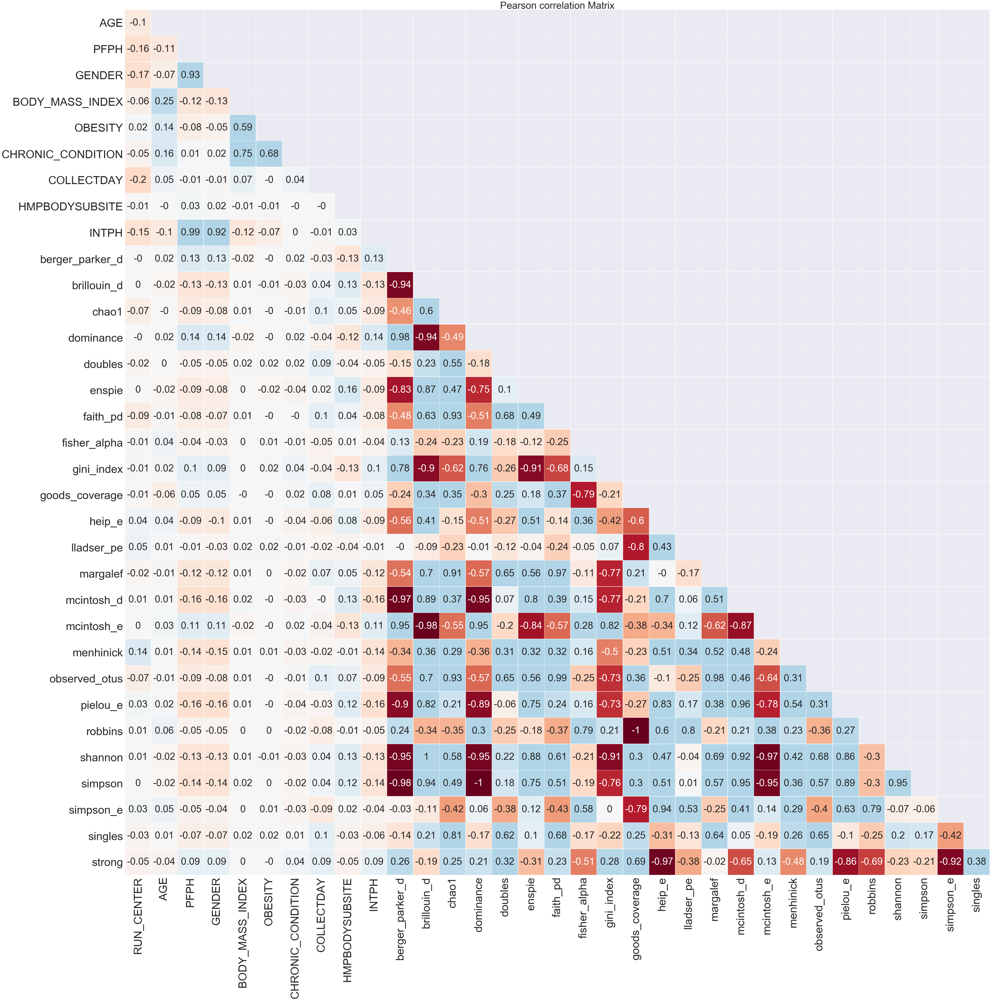

In [23]:
corr = meta_alpha.corr(method='pearson')
def draw_corrplot(corr, figsize=(80,78), cmap="RdBu", annot=True, cbar=False, title="Pearson correlation Matrix",
                 ylim=(34,1), xlim=(0,33),
                 ):
    corr = corr.round(2)
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=figsize)
    sns.set(font_scale=4)
    ax = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=annot,
                     square=True, linewidths=.5, cbar=cbar)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)
    plt.title(title)

draw_corrplot(corr)

In [11]:
### beta diversity
bc = beta_diversity('braycurtis', tax.drop(['SampleID'],axis=1).values, tax['SampleID'])
#uw = beta_diversity('unweighted_unifrac', tax.drop(['SampleID'],axis=1).values, tax['SampleID'], otu_ids=otu_ids, tree=tree)
#wf = beta_diversity('weighted_unifrac', tax.drop(['SampleID'],axis=1).values, tax['SampleID'], otu_ids=otu_ids, tree=tree)
#jc = beta_diversity('jaccard', tax.drop(['SampleID'],axis=1).values, tax['SampleID'])


In [12]:
def generate_rowcolors(meta, column="HMPBODYSUBSITE"):
    lut = dict(zip(set(meta[column]), sns.hls_palette(len(set(meta[column]+1)), l=0.5, s=0.8)))
    row_colors = meta[column].map(lut)
    return row_colors

row_colors = pd.concat([
              generate_rowcolors(meta_alpha), 
              generate_rowcolors(meta_alpha, column="GENDER"),
              generate_rowcolors(meta_alpha, column="OBESITY"),
              generate_rowcolors(meta_alpha, column="CHRONIC_CONDITION"),
             ],axis=1)

## Visualize beta diversity (bray curtis)

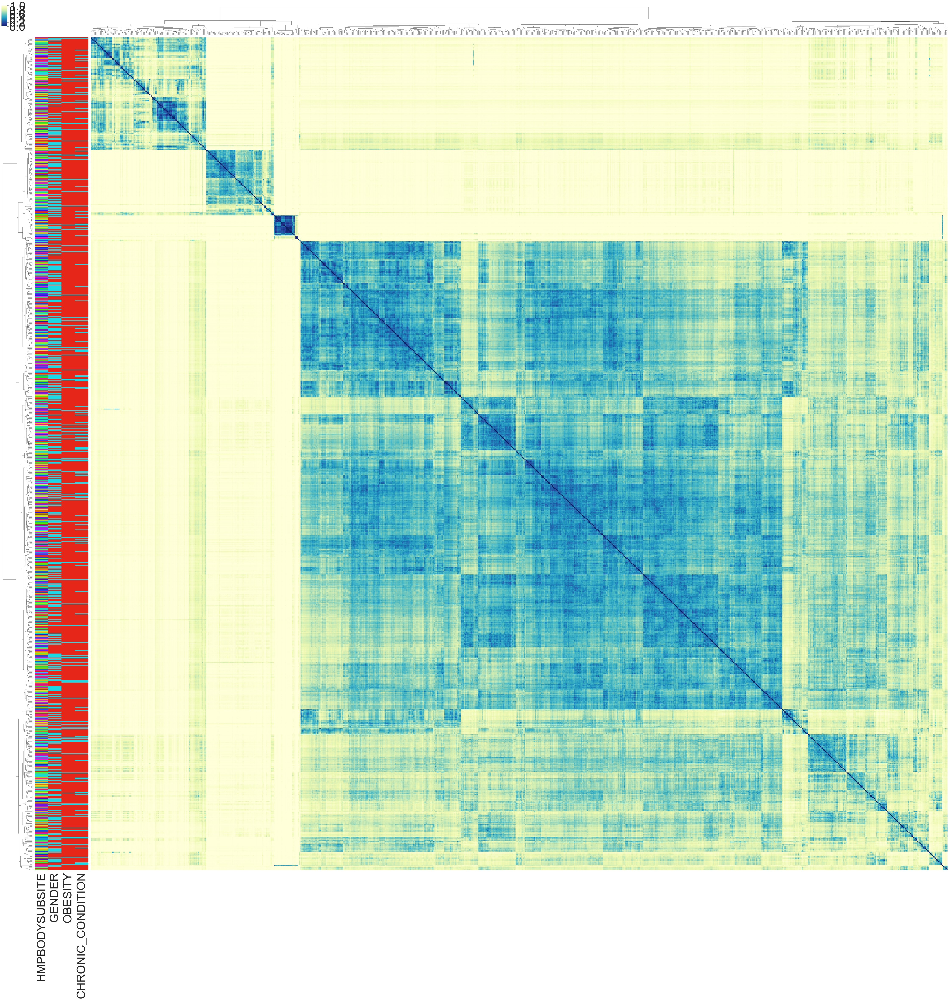

In [13]:
N = 1000
sns.set(font_scale=5)
sns.clustermap(pd.DataFrame(bc.data[:N,:N]), cmap="YlGnBu_r", row_colors=row_colors[:N], yticklabels=False, xticklabels=False, figsize=(80, 75))


## PcoA

In [14]:
from skbio.stats.ordination import pcoa
PCoA = pcoa(bc.data).samples[['PC1','PC2','PC3']]
meta_alpha = meta_alpha[meta_alpha['SampleID'].isin(tax['SampleID'])]
meta_alpha = meta_alpha.reindex()
PCoA.index = meta_alpha.index
meta_pcoa = pd.concat([meta_alpha, PCoA],axis=1)


In [16]:
import plotly.express as px
import colorlover as cl

palette = cl.interp(cl.scales['11']['qual']['Paired'], 18)
COLORMAP = dict(zip([f'{i}' for i in range(18)], palette))
meta_pcoa['HMPBODYSUBSITE'] = meta_pcoa['HMPBODYSUBSITE'].astype(str)


fig = px.scatter_3d(meta_pcoa, x="PC1", y="PC2", z="PC3", color="HMPBODYSUBSITE", symbol="GENDER", size="simpson",opacity=0.7,
                   color_discrete_map = COLORMAP)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))


## Model training

In [17]:
df = pd.merge(meta_alpha, tax, on="SampleID")
tax = tax[tax['SampleID'].isin(df['SampleID'])]
df.shape

(6087, 1256)

In [18]:
for col in ['chao1_ci','esty_ci','osd']:
    df[f'{col}_0'] = df[col].apply(lambda t: t[0])
    df[f'{col}_1'] = df[col].apply(lambda t: t[1])
    if col =='osd':
        df[f'{col}_2'] = df[col].apply(lambda t: t[2])
df = df.drop(['chao1_ci','esty_ci','osd'],axis=1)
    

In [19]:
def KFold_model(df, MODEL, param, n_splits=5):
    n_splits=5
    MODEL=RandomForestClassifier
    param = dict(max_depth=128, max_features='sqrt', n_estimators=400, bootstrap=False, random_state=42, n_jobs=-1)

    folds = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    oof = np.zeros(len(df))
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(df, df['HMPBODYSUBSITE'])):
        x_trn, y_trn = df.drop(['SampleID','HMPBODYSUBSITE', 'heip_e', 'lladser_pe', 'margalef', 'mcintosh_d', 'pielou_e'],axis=1).iloc[trn_idx].values, df['HMPBODYSUBSITE'].iloc[trn_idx].values
        x_val, y_val = df.drop(['SampleID','HMPBODYSUBSITE', 'heip_e', 'lladser_pe', 'margalef', 'mcintosh_d', 'pielou_e'],axis=1).iloc[val_idx].values, df['HMPBODYSUBSITE'].iloc[val_idx].values

        model = MODEL(**param)
        model.fit(x_trn, y_trn)
        preds = model.predict(x_val)
        oof[val_idx] = preds
        F1 = f1_score(preds, y_val, average='micro')
        print('fold {} f1 score: {}'.format(fold_, F1))
    F1 = f1_score(oof, df['HMPBODYSUBSITE'], average='micro')
    print('OOF f1 score: {}'.format(F1))
    return oof, model


### RandomForestClassifier

In [20]:
param = dict(max_depth=128, max_features='sqrt', n_estimators=400, bootstrap=False, random_state=42, n_jobs=-1)
oof, model = KFold_model(df, RandomForestClassifier, param)


fold 0 f1 score: 0.6930612244897959
fold 1 f1 score: 0.6794766966475879
fold 2 f1 score: 0.6559934318555009
fold 3 f1 score: 0.6782178217821783
fold 4 f1 score: 0.684863523573201
OOF f1 score: 0.678330869065221


### lightgbm

In [21]:
def KFold_lgb(df, param, n_splits=5, CATEGORICAL=["RUN_CENTER", "GENDER","OBESITY","CHRONIC_CONDITION"]):
    folds = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    oof = np.zeros(len(df))
    feature_importance_df = pd.DataFrame()
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(df, df['HMPBODYSUBSITE'])):
        print("fold {}".format(fold_))
        trn_data = lgb.Dataset(df.drop(['SampleID','HMPBODYSUBSITE'],axis=1).iloc[trn_idx], label=df['HMPBODYSUBSITE'].iloc[trn_idx], 
                               categorical_feature=CATEGORICAL
                              )
        val_data = lgb.Dataset(df.drop(['SampleID','HMPBODYSUBSITE'],axis=1).iloc[val_idx], label=df['HMPBODYSUBSITE'].iloc[val_idx], 
                               categorical_feature=CATEGORICAL
                              )

        num_round = 10000
        clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=500, early_stopping_rounds=100)
        preds = clf.predict(df.drop(['SampleID','HMPBODYSUBSITE'],axis=1).iloc[val_idx], num_iteration=clf.best_iteration)
        oof[val_idx] = np.argmax(preds, axis=1)

        fold_importance_df = pd.DataFrame()
        fold_importance_df["Feature"] = list(df.drop(['SampleID','HMPBODYSUBSITE'],axis=1).columns)
        fold_importance_df["importance"] = clf.feature_importance()
        fold_importance_df["fold"] = fold_ + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        
        F1 = f1_score(oof[val_idx], df['HMPBODYSUBSITE'].iloc[val_idx], average='micro')
        print('fold {} f1 score: {}'.format(fold_, F1))
    
    F1 = f1_score(oof, df['HMPBODYSUBSITE'], average='micro')
    print('OOF f1 score: {}'.format(F1))
    feature_importance_mean = 0.2*(
        feature_importance_df[['Feature', 'importance']][feature_importance_df['fold']==1].set_index('Feature') + 
        feature_importance_df[['Feature', 'importance']][feature_importance_df['fold']==2].set_index('Feature') + 
        feature_importance_df[['Feature', 'importance']][feature_importance_df['fold']==3].set_index('Feature') + 
        feature_importance_df[['Feature', 'importance']][feature_importance_df['fold']==4].set_index('Feature') +
        feature_importance_df[['Feature', 'importance']][feature_importance_df['fold']==5].set_index('Feature')
    )
    return oof, feature_importance_mean, clf, val_idx


In [30]:
param = {'num_leaves': 63,
         'min_data_in_leaf': 30,
         'objective': 'multiclass',
         "metric": 'multi_logloss',
         "num_class": 18,
         'max_depth': -1,
         'learning_rate': 0.005,
         "min_child_samples": 20,
         "boosting": "gbdt",
         "feature_fraction": 0.7,
         "bagging_freq": 1,
         "bagging_fraction": 0.9,
         "bagging_seed": 12,
         "reg_lambda": 1,
         'reg_alpha': 1,
         "verbosity": -1,
         "nthread": -1,
         "random_state": 1
         }
oof, feature_importance_mean, clf, val_idx = KFold_lgb(df, param)

fold 0
Training until validation scores don't improve for 100 rounds
[500]	training's multi_logloss: 0.716104	valid_1's multi_logloss: 1.09235
[1000]	training's multi_logloss: 0.352233	valid_1's multi_logloss: 0.857064
[1500]	training's multi_logloss: 0.213246	valid_1's multi_logloss: 0.791599
[2000]	training's multi_logloss: 0.14859	valid_1's multi_logloss: 0.768938
[2500]	training's multi_logloss: 0.114347	valid_1's multi_logloss: 0.761063
Early stopping, best iteration is:
[2869]	training's multi_logloss: 0.0986768	valid_1's multi_logloss: 0.759757
fold 0 f1 score: 0.7232653061224489
fold 1
Training until validation scores don't improve for 100 rounds
[500]	training's multi_logloss: 0.709609	valid_1's multi_logloss: 1.11068
[1000]	training's multi_logloss: 0.346576	valid_1's multi_logloss: 0.889116
[1500]	training's multi_logloss: 0.208708	valid_1's multi_logloss: 0.832419
[2000]	training's multi_logloss: 0.144938	valid_1's multi_logloss: 0.818061
[2500]	training's multi_logloss: 0.

## Visualize OUT-OF-FOLD confusion matrix
    model confused with: 
        left & right antecubital fossa
        left & right retroauricular crease
        subgingival plaque & supraginival plaque
        throat & palatine tonsil

Text(0.5, 1, 'Confusion Matrix')

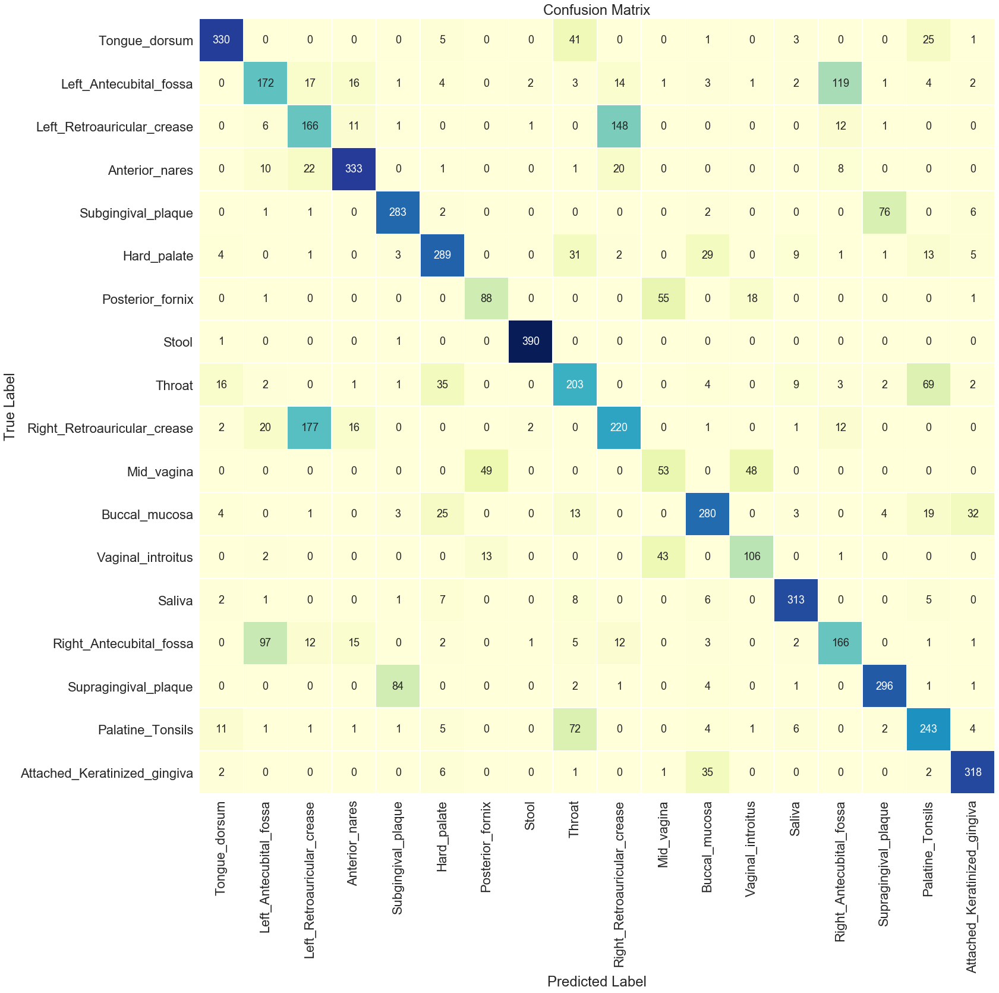

In [31]:
plt.figure(figsize=(24,24))
sns.set(font_scale=2)
ax = sns.heatmap(confusion_matrix(pd.Series(oof), 
                             df['HMPBODYSUBSITE']), 
            cmap="YlGnBu", annot=True, cbar=False, annot_kws={"size":18},
            linewidths=0.5,fmt="d", 
           xticklabels=Dict.keys(), yticklabels=Dict.keys()
           )
ax.set_ylim(18, -0.01)

plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')


## Feature importance

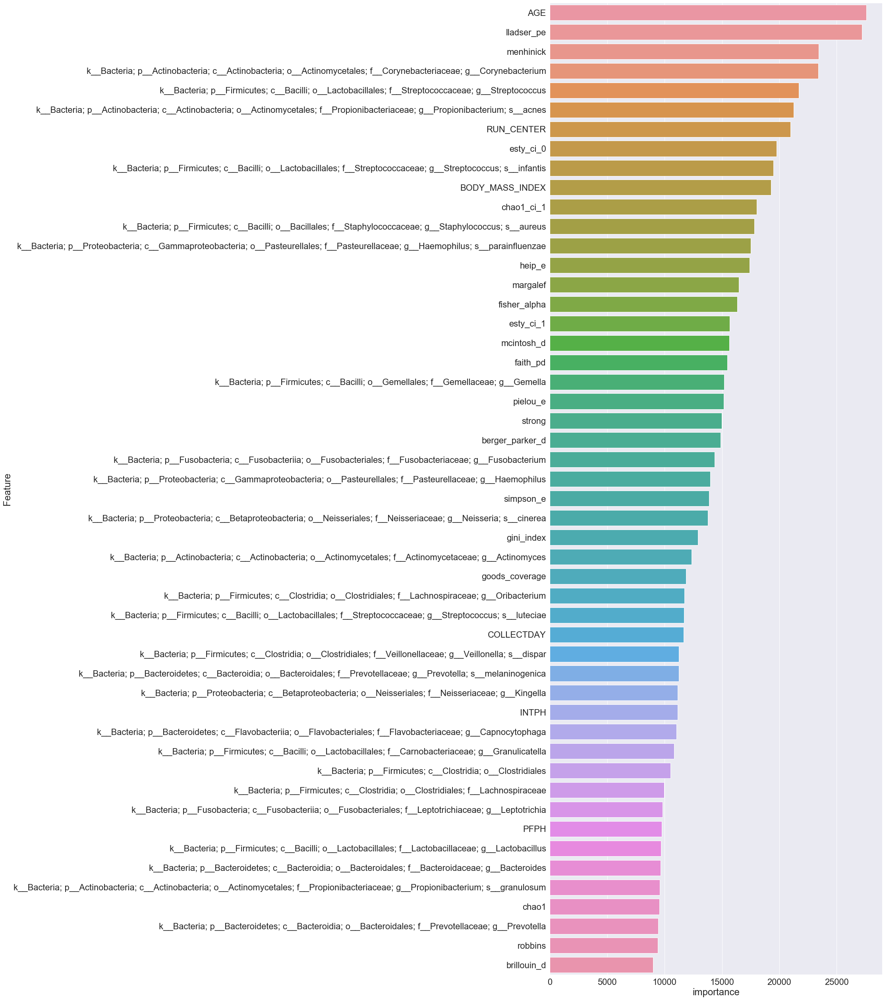

In [32]:
plt.figure(figsize=(15,45))
sns.barplot(x="importance",
            y="Feature",
            data=feature_importance_mean.sort_values(by="importance", ascending=False)[:50].reset_index())


## Model interpretation
    what feature has the greatest impact on model output?

In [33]:
import shap
valid_x = df.drop(['SampleID','HMPBODYSUBSITE'],axis=1).iloc[val_idx]
shap_values = shap.TreeExplainer(clf).shap_values(valid_x)


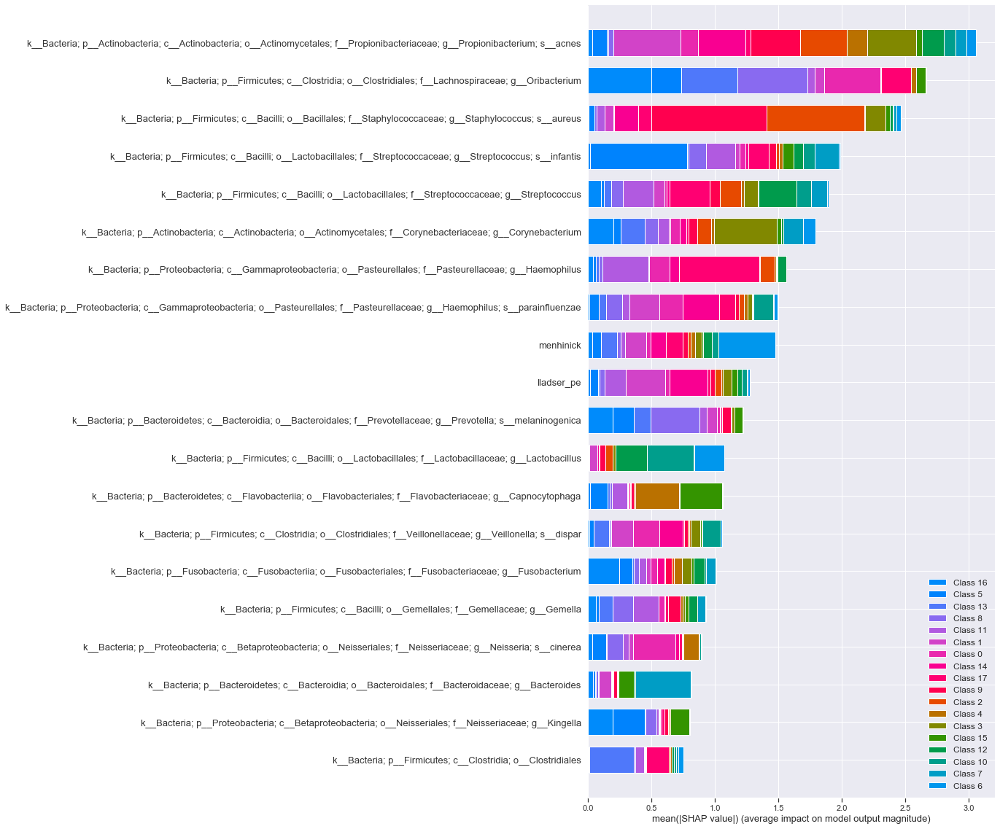

In [34]:
shap.summary_plot(shap_values, valid_x, plot_size=(10,20))

In [35]:
@interact
def display_shap_summary(site=list(Dict.keys())):
    # Visualize what feature contributes most to each class
    idx = np.where(np.array(list(Dict.keys()))==site)[0].tolist()[0]
    shap.summary_plot(shap_values[idx], valid_x, plot_size=(10,20))


interactive(children=(Dropdown(description='site', options=('Tongue_dorsum', 'Left_Antecubital_fossa', 'Left_R…